<a href="https://colab.research.google.com/github/laurindodumba/Trabalho-em-de-Vis-o-Comptuacional-UFSC/blob/main/segm_yolov8_folha_fundo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Montando o drive gdrive

In [ ]:
#imput pelo googlecolab
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


Unzip

In [ ]:
from zipfile import ZipFile
file_name = '/content/gdrive/MyDrive/Colab Notebooks/INE410121 - VC 2023 - files/Tomato-yellow leaf curl virus-.v1i.yolov8.zip'
#salvar o dataset no gdrive e mudar caminho quem for o rodar
#file_name = '/content/gdrive/MyDrive/etc...'
with ZipFile(file_name, 'r') as zip:
  zip.extractall()
  print('Done')

Done


reorganizando as pastas

In [ ]:
import os
import shutil

In [ ]:
ls

data.yaml  gdrive/  README.dataset.txt  README.roboflow.txt  sample_data/  test/  train/  valid/


In [ ]:
!mkdir dataset_folha

In [ ]:
original = '/content/train'
target = '/content/dataset_folha'

shutil.move(original, target)

'/content/dataset_folha/train'

In [ ]:
original = '/content/test'
target = '/content/dataset_folha'

shutil.move(original, target)

'/content/dataset_folha/test'

In [ ]:
original = '/content/valid'
target = '/content/dataset_folha'

shutil.move(original, target)

'/content/dataset_folha/valid'

In [ ]:
original = '/content/data.yaml'
target = '/content/dataset_folha'

shutil.move(original, target)

'/content/dataset_folha/data.yaml'

**YOLOV8 Segmentação**

In [ ]:
pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.9/645.9 kB 10.5 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

fazendo download modelo pre treinado

In [ ]:
#Models download automatically from the latest Ultralytics release on first use.
model = YOLO('yolov8n-seg.pt')  # load a pretrained model (recommended for training)

100%|██████████| 6.73M/6.73M [00:00<00:00, 84.7MB/s]


testando com uma predição

In [ ]:
import cv2


função para mostrar as imagens

modificar yaml file

In [ ]:
train: /content/dataset_folha/train/images
val: /content/dataset_folha/valid/images
test: /content/dataset_folha/test/images

nc: 1
names: ['folha']

roboflow:
  workspace: youssef-khaled-yei9d
  project: tomato-yellow-leaf-curl-virus-mbbg1
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/youssef-khaled-yei9d/tomato-yellow-leaf-curl-virus-mbbg1/dataset/1

**trainging the model**

In [ ]:
results = model.train(data='/content/dataset_folha/data.yaml', epochs=100, imgsz=640, project='seg_folha_fundo')

Ultralytics YOLOv8.0.219 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/content/dataset_folha/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=seg_folha_fundo, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wi

100%|██████████| 755k/755k [00:00<00:00, 15.6MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 71.0MB/s]


AMP: checks passed ✅


train: Scanning /content/dataset_folha/train/labels... 153 images, 1 backgrounds, 0 corrupt: 100%|██████████| 153/153 [00:00<00:00, 1355.42it/s]

train: New cache created: /content/dataset_folha/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset_folha/valid/labels... 43 images, 1 backgrounds, 0 corrupt: 100%|██████████| 43/43 [00:00<00:00, 705.92it/s]

val: New cache created: /content/dataset_folha/valid/labels.cache


Plotting labels to seg_folha_fundo/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to seg_folha_fundo/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.29G     0.7884      2.971      2.474      1.317         29        640: 100%|██████████| 10/10 [00:11<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]

                   all         43         42    0.00326          1       0.79      0.582    0.00326          1       0.79      0.591



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.02G     0.4892     0.7389      1.166      1.093         27        640: 100%|██████████| 10/10 [00:03<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.56it/s]

                   all         43         42      0.974      0.906      0.976      0.721      0.974      0.906      0.976      0.911



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.03G      0.436     0.5428     0.8623      1.037         26        640: 100%|██████████| 10/10 [00:03<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.47it/s]

                   all         43         42      0.977          1      0.987      0.648      0.977          1      0.987      0.906



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.12G     0.5124     0.5748     0.9242       1.09         29        640: 100%|██████████| 10/10 [00:04<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.81it/s]

                   all         43         42      0.922      0.952      0.975      0.597      0.946      0.976      0.983      0.971



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.01G     0.5042     0.4955      0.866      1.083         25        640: 100%|██████████| 10/10 [00:03<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]

                   all         43         42      0.891      0.905       0.97      0.448      0.715      0.643      0.615      0.132



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.06G     0.4946     0.4884     0.8434      1.066         26        640: 100%|██████████| 10/10 [00:03<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]


                   all         43         42        0.9      0.976      0.974      0.544      0.765      0.833      0.831      0.374

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.01G     0.4799     0.4224     0.7863      1.041         26        640: 100%|██████████| 10/10 [00:04<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.07it/s]

                   all         43         42      0.892      0.976      0.973      0.717      0.892      0.976      0.973      0.858



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/100         3G      0.509     0.4261     0.7783      1.058         28        640: 100%|██████████| 10/10 [00:03<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         43         42      0.867      0.934      0.945      0.576      0.845      0.911      0.925       0.47



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.05G     0.5455     0.5253     0.7897      1.106         31        640: 100%|██████████| 10/10 [00:03<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         43         42      0.754      0.876      0.889      0.586      0.754      0.876      0.891      0.535



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/100      3.03G     0.5568     0.4771      0.761      1.074         26        640: 100%|██████████| 10/10 [00:04<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.06it/s]

                   all         43         42      0.925      0.976      0.959      0.683      0.925      0.976      0.959      0.853



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.97G     0.5317     0.4309     0.7028      1.075         20        640: 100%|██████████| 10/10 [00:03<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.04it/s]


                   all         43         42      0.929          1      0.972      0.711      0.929          1      0.972      0.953

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.01G     0.4669     0.4221     0.6417      1.056         28        640: 100%|██████████| 10/10 [00:03<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.57it/s]

                   all         43         42      0.726      0.738      0.832      0.363      0.726      0.738      0.844      0.699



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.01G      0.519     0.4434     0.6401       1.06         28        640: 100%|██████████| 10/10 [00:03<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]

                   all         43         42      0.954      0.989      0.974      0.829      0.954      0.989      0.974      0.931



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.01G     0.4777     0.4565     0.5927      1.067         26        640: 100%|██████████| 10/10 [00:03<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.67it/s]

                   all         43         42      0.913      0.997      0.975      0.769      0.913      0.997      0.975      0.949



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/100      3.02G     0.4515      0.455     0.5994       1.03         18        640: 100%|██████████| 10/10 [00:03<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         43         42       0.97      0.976      0.984      0.813       0.97      0.976      0.984       0.95



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.06G     0.4541     0.4805     0.5515      1.027         25        640: 100%|██████████| 10/10 [00:03<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all         43         42      0.974          1      0.983      0.766      0.974          1      0.983      0.964



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.01G     0.4563     0.4603     0.5458      1.044         24        640: 100%|██████████| 10/10 [00:04<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.80it/s]

                   all         43         42      0.936      0.952      0.977      0.827      0.936      0.952      0.979       0.96



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.99G     0.4343     0.4364     0.5258      1.023         27        640: 100%|██████████| 10/10 [00:03<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.93it/s]

                   all         43         42      0.804      0.905      0.952      0.614      0.804      0.905      0.952      0.871



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.99G     0.4481     0.4534     0.5318      1.008         27        640: 100%|██████████| 10/10 [00:03<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.77it/s]

                   all         43         42      0.443      0.833      0.561      0.179      0.741      0.786      0.797      0.309



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.04G     0.4527     0.3843     0.5347      1.029         22        640: 100%|██████████| 10/10 [00:04<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]

                   all         43         42      0.701      0.762      0.781      0.388      0.767      0.833      0.824      0.561



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/100      3.01G      0.415     0.4684     0.4971     0.9863         28        640: 100%|██████████| 10/10 [00:03<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.67it/s]

                   all         43         42      0.697      0.881      0.792      0.465      0.697      0.881      0.794      0.623



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.03G     0.4265     0.3963     0.4954      1.002         25        640: 100%|██████████| 10/10 [00:03<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]

                   all         43         42      0.897      0.881      0.952      0.699      0.897      0.881      0.952      0.763



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.01G     0.4387     0.3893     0.4767      1.033         22        640: 100%|██████████| 10/10 [00:03<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]

                   all         43         42      0.975          1      0.981      0.659      0.975          1      0.981      0.881



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.05G     0.4404     0.3816     0.4855       1.01         25        640: 100%|██████████| 10/10 [00:04<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]

                   all         43         42      0.925      0.952      0.968      0.478      0.925      0.952      0.968      0.916



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.95G     0.4025      0.377     0.4581     0.9947         18        640: 100%|██████████| 10/10 [00:03<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         43         42      0.951      0.918      0.974      0.658      0.951      0.918      0.974      0.912



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/100      3.01G     0.4102      0.365     0.4374      1.003         31        640: 100%|██████████| 10/10 [00:03<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.91it/s]

                   all         43         42      0.971      0.952      0.986       0.79      0.971      0.952      0.986      0.918



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.99G     0.4054      0.394     0.4148     0.9994         26        640: 100%|██████████| 10/10 [00:04<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.34it/s]

                   all         43         42      0.976      0.976      0.974      0.685      0.976      0.976      0.974       0.91



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/100      3.01G     0.4089     0.4254      0.419      1.004         31        640: 100%|██████████| 10/10 [00:03<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]

                   all         43         42      0.954          1      0.971      0.756      0.954          1      0.971      0.959



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.01G     0.4157     0.4097     0.4285      0.985         27        640: 100%|██████████| 10/10 [00:03<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.79it/s]

                   all         43         42      0.977      0.998      0.972      0.639      0.977      0.998      0.972      0.972



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/100      3.02G     0.3922     0.3784     0.4181      0.992         26        640: 100%|██████████| 10/10 [00:04<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.14it/s]

                   all         43         42      0.947      0.952      0.971      0.844      0.947      0.952      0.972      0.961



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.01G     0.3967     0.3673     0.4205     0.9984         24        640: 100%|██████████| 10/10 [00:03<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         43         42      0.754      0.929      0.901      0.342      0.793      0.952      0.921      0.609



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.02G     0.3725     0.3395     0.4104     0.9648         26        640: 100%|██████████| 10/10 [00:03<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.20it/s]

                   all         43         42      0.747      0.952      0.909      0.608      0.765      0.976      0.911      0.769



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.03G     0.4146     0.4347     0.4279      1.007         25        640: 100%|██████████| 10/10 [00:03<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.37it/s]

                   all         43         42      0.885          1      0.956      0.816      0.885          1      0.956      0.906



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.01G     0.3993     0.3942     0.4041     0.9904         24        640: 100%|██████████| 10/10 [00:04<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.67it/s]

                   all         43         42      0.969      0.952      0.976      0.908      0.969      0.952      0.976      0.969



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/100      3.03G     0.4134     0.4411       0.42      1.004         30        640: 100%|██████████| 10/10 [00:03<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.74it/s]


                   all         43         42      0.974      0.976       0.98      0.915      0.974      0.976       0.98      0.949

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.99G      0.374      0.383     0.3878     0.9834         29        640: 100%|██████████| 10/10 [00:03<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]

                   all         43         42      0.976          1      0.975       0.92      0.976          1      0.975      0.966



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.01G      0.338     0.3409     0.3572      0.958         22        640: 100%|██████████| 10/10 [00:04<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]

                   all         43         42      0.975          1      0.983      0.941      0.975          1      0.983      0.975



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/100      3.03G     0.3714     0.3682     0.3736     0.9764         26        640: 100%|██████████| 10/10 [00:03<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.86it/s]

                   all         43         42      0.975          1      0.984      0.932      0.975          1      0.984      0.972



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.99G     0.3597     0.3834     0.3648     0.9785         28        640: 100%|██████████| 10/10 [00:03<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]

                   all         43         42      0.976          1      0.986      0.944      0.976          1      0.986      0.978



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.99G     0.3538     0.3794     0.3598     0.9659         23        640: 100%|██████████| 10/10 [00:04<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.32it/s]

                   all         43         42      0.975          1      0.989      0.924      0.975          1      0.989      0.972



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.01G     0.3299     0.3562     0.3397     0.9593         31        640: 100%|██████████| 10/10 [00:03<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         43         42      0.953          1       0.97      0.887      0.953          1       0.97      0.962



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.03G     0.3764     0.3788     0.3773     0.9985         31        640: 100%|██████████| 10/10 [00:03<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.15it/s]

                   all         43         42      0.858      0.976       0.96      0.711      0.858      0.976       0.96      0.867



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.99G     0.3517     0.3805     0.3578     0.9629         29        640: 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.41it/s]

                   all         43         42       0.91      0.966      0.966       0.72       0.91      0.966      0.966      0.844



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.02G     0.3326     0.3547     0.3287     0.9463         29        640: 100%|██████████| 10/10 [00:04<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.93it/s]

                   all         43         42      0.972          1      0.976       0.77      0.972          1      0.976      0.933



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.01G     0.3404       0.38     0.3434     0.9617         21        640: 100%|██████████| 10/10 [00:03<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.06it/s]

                   all         43         42      0.975          1      0.976      0.885      0.975          1      0.976      0.974



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.01G     0.3363     0.3287     0.3492     0.9699         23        640: 100%|██████████| 10/10 [00:03<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.49it/s]

                   all         43         42      0.971          1      0.983      0.944      0.971          1      0.983      0.978



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.04G     0.3533     0.3377     0.3429     0.9585         24        640: 100%|██████████| 10/10 [00:04<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.53it/s]

                   all         43         42      0.975          1      0.978      0.934      0.975          1      0.978      0.969



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.97G     0.3531     0.3589     0.3411      0.963         25        640: 100%|██████████| 10/10 [00:03<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         43         42      0.953          1      0.973      0.877      0.953          1      0.973       0.97



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.04G     0.3628     0.3628     0.3419     0.9515         28        640: 100%|██████████| 10/10 [00:03<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         43         42      0.953          1      0.968      0.893      0.953          1      0.968      0.957



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/100      3.02G     0.3507     0.3466     0.3323     0.9789         22        640: 100%|██████████| 10/10 [00:03<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]

                   all         43         42      0.974          1      0.982      0.948      0.974          1      0.982       0.98



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.99G     0.3351     0.3727     0.3141     0.9445         31        640: 100%|██████████| 10/10 [00:03<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.01it/s]

                   all         43         42      0.969          1      0.981       0.94      0.969          1      0.981      0.977



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.99G     0.3206      0.348     0.3154     0.9571         23        640: 100%|██████████| 10/10 [00:03<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         43         42      0.949          1      0.986      0.922      0.949          1      0.986      0.982



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.99G     0.3311     0.3691     0.3311     0.9531         24        640: 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.21it/s]

                   all         43         42      0.974          1      0.994      0.961      0.974          1      0.994      0.992



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.97G     0.3343     0.3563      0.358     0.9694         25        640: 100%|██████████| 10/10 [00:03<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         43         42      0.975          1      0.984      0.947      0.975          1      0.984      0.976



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.99G      0.339     0.3529     0.3421     0.9425         31        640: 100%|██████████| 10/10 [00:03<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]

                   all         43         42      0.975          1      0.986      0.941      0.975          1      0.986      0.971



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.03G     0.2995     0.3382     0.3047      0.932         26        640: 100%|██████████| 10/10 [00:03<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]

                   all         43         42      0.965          1      0.985      0.918      0.965          1      0.985      0.966



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.03G     0.3317     0.3624     0.3308     0.9483         28        640: 100%|██████████| 10/10 [00:03<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]

                   all         43         42      0.974          1      0.984      0.949      0.974          1      0.984       0.98



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.03G     0.3257     0.3685     0.2985     0.9479         31        640: 100%|██████████| 10/10 [00:03<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.77it/s]

                   all         43         42      0.973          1      0.985      0.952      0.973          1      0.985      0.983



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/100      3.01G     0.3303     0.3402     0.3097     0.9532         26        640: 100%|██████████| 10/10 [00:02<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.44it/s]

                   all         43         42       0.97          1      0.986      0.942       0.97          1      0.986      0.986



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.99G       0.31     0.3251     0.2935     0.9438         30        640: 100%|██████████| 10/10 [00:04<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         43         42      0.974          1      0.983      0.959      0.974          1      0.983      0.974



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.99G     0.2969      0.324     0.3095     0.9391         20        640: 100%|██████████| 10/10 [00:03<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         43         42      0.974          1      0.991      0.965      0.974          1      0.991      0.968



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.01G     0.2975      0.313     0.2844     0.9318         24        640: 100%|██████████| 10/10 [00:03<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.51it/s]

                   all         43         42      0.976          1      0.992      0.964      0.976          1      0.992      0.989



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.99G     0.3019     0.3241     0.2871       0.93         28        640: 100%|██████████| 10/10 [00:04<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.14it/s]

                   all         43         42      0.975          1      0.993      0.981      0.975          1      0.993       0.99



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.03G     0.2969     0.3147     0.2859     0.9339         24        640: 100%|██████████| 10/10 [00:03<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         43         42      0.976          1       0.99      0.968      0.976          1       0.99      0.985



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.99G     0.2986     0.3133     0.2887     0.9363         28        640: 100%|██████████| 10/10 [00:03<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.81it/s]

                   all         43         42      0.976          1      0.988      0.951      0.976          1      0.988      0.983



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.97G     0.2994     0.3481     0.2928     0.9411         30        640: 100%|██████████| 10/10 [00:04<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.39it/s]

                   all         43         42      0.976          1      0.982      0.964      0.976          1      0.982      0.978



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.08G     0.3015     0.3298     0.2928     0.9453         29        640: 100%|██████████| 10/10 [00:03<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.81it/s]

                   all         43         42      0.976          1       0.98       0.94      0.976          1       0.98      0.976



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.99G      0.314     0.3572     0.2826     0.9547         24        640: 100%|██████████| 10/10 [00:03<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]

                   all         43         42      0.976          1      0.984      0.963      0.976          1      0.984      0.981



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.03G     0.3057     0.3439     0.2952     0.9584         29        640: 100%|██████████| 10/10 [00:03<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         43         42      0.976          1      0.979      0.975      0.976          1      0.979      0.976



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/100      3.01G     0.2886     0.3344     0.2915     0.9309         26        640: 100%|██████████| 10/10 [00:03<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]

                   all         43         42      0.976          1      0.986      0.986      0.976          1      0.986      0.984



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.99G     0.2838      0.356     0.2691     0.9436         23        640: 100%|██████████| 10/10 [00:02<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]


                   all         43         42      0.976          1      0.985      0.985      0.976          1      0.985      0.985

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/100      3.01G     0.3037     0.3433     0.2608     0.9494         26        640: 100%|██████████| 10/10 [00:03<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  2.00it/s]

                   all         43         42      0.976          1      0.985      0.968      0.976          1      0.985      0.985



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/100      3.01G     0.2676     0.3303     0.2574     0.9328         28        640: 100%|██████████| 10/10 [00:04<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.81it/s]

                   all         43         42      0.976          1      0.988      0.977      0.976          1      0.988      0.988



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.01G     0.2996      0.354     0.2805     0.9496         30        640: 100%|██████████| 10/10 [00:03<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.02it/s]

                   all         43         42      0.976          1      0.984      0.964      0.976          1      0.984      0.982



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.97G     0.2922     0.3784     0.2698     0.9367         26        640: 100%|██████████| 10/10 [00:02<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.81it/s]

                   all         43         42      0.975          1      0.981      0.962      0.975          1      0.981      0.981



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/100      3.03G      0.297     0.3596     0.2638     0.9456         26        640: 100%|██████████| 10/10 [00:04<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]

                   all         43         42      0.977      0.996      0.988      0.969      0.977      0.996      0.988      0.986



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.99G     0.2805     0.3434     0.2607     0.9337         19        640: 100%|██████████| 10/10 [00:03<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.89it/s]

                   all         43         42      0.962      0.952      0.986      0.955      0.962      0.952      0.986      0.978



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/100      3.02G      0.264     0.3073     0.2492     0.9257         22        640: 100%|██████████| 10/10 [00:03<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         43         42      0.954      0.997      0.987      0.957      0.954      0.997      0.987      0.975



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/100      3.01G     0.2867     0.3259     0.2486     0.9516         26        640: 100%|██████████| 10/10 [00:03<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]

                   all         43         42      0.975          1      0.982      0.959      0.975          1      0.982       0.98



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/100      3.01G     0.2944     0.3129      0.266     0.9484         21        640: 100%|██████████| 10/10 [00:03<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]

                   all         43         42      0.975          1      0.977      0.954      0.975          1      0.977      0.975



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/100      3.01G     0.2592      0.308     0.2349     0.9265         22        640: 100%|██████████| 10/10 [00:03<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         43         42      0.975          1      0.978      0.952      0.975          1      0.978      0.971



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.99G     0.2554      0.318     0.2374     0.9266         27        640: 100%|██████████| 10/10 [00:03<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.47it/s]

                   all         43         42      0.975          1      0.981      0.949      0.975          1      0.981       0.97



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/100      3.01G     0.2474     0.3028     0.2411     0.9283         26        640: 100%|██████████| 10/10 [00:04<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]

                   all         43         42      0.975          1      0.981      0.947      0.975          1      0.981      0.971



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.03G     0.2444     0.2952     0.2243     0.9258         27        640: 100%|██████████| 10/10 [00:03<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.92it/s]

                   all         43         42      0.975          1      0.984       0.96      0.975          1      0.984      0.978



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.99G     0.2662     0.3102     0.2516     0.9207         17        640: 100%|██████████| 10/10 [00:02<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         43         42      0.975          1       0.98      0.959      0.975          1       0.98      0.975



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/100      3.03G     0.2598     0.2877     0.2486     0.9216         25        640: 100%|██████████| 10/10 [00:04<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]

                   all         43         42      0.976          1      0.987      0.958      0.976          1      0.987      0.982



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/100      3.01G     0.2662     0.3019     0.2351     0.9334         25        640: 100%|██████████| 10/10 [00:03<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]

                   all         43         42      0.977      0.999      0.987      0.964      0.977      0.999      0.987      0.985



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/100      3.03G     0.2369     0.3009     0.2149     0.9097         23        640: 100%|██████████| 10/10 [00:02<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]

                   all         43         42      0.976          1      0.993      0.988      0.976          1      0.993      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/100      3.01G     0.2668      0.334      0.233     0.9434         22        640: 100%|██████████| 10/10 [00:04<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.54it/s]

                   all         43         42      0.976          1      0.991      0.983      0.976          1      0.991      0.991



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/100      3.01G     0.2626     0.3267     0.2471     0.9262         25        640: 100%|██████████| 10/10 [00:03<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         43         42      0.976          1       0.99      0.983      0.976          1       0.99      0.988


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/100      3.33G     0.2017     0.2044     0.3175     0.9579          9        640: 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.88it/s]

                   all         43         42      0.976          1      0.991      0.984      0.976          1      0.991      0.988



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/100      3.05G     0.1741     0.2037     0.2578     0.9221          9        640: 100%|██████████| 10/10 [00:04<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.06it/s]

                   all         43         42      0.976          1      0.981      0.972      0.976          1      0.981      0.981



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.91G     0.1588     0.2039     0.2399     0.9283          8        640: 100%|██████████| 10/10 [00:02<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.23it/s]

                   all         43         42      0.976          1      0.978       0.97      0.976          1      0.978      0.975



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/100      3.05G     0.1562     0.2029     0.2262      0.918          9        640: 100%|██████████| 10/10 [00:02<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]

                   all         43         42      0.976          1      0.979       0.97      0.976          1      0.979      0.979



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.91G     0.1479     0.1926     0.2009     0.9138          9        640: 100%|██████████| 10/10 [00:03<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.83it/s]


                   all         43         42      0.976          1      0.982      0.975      0.976          1      0.982      0.982

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.91G     0.1583     0.2107     0.2121     0.9271          9        640: 100%|██████████| 10/10 [00:03<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.21it/s]


                   all         43         42      0.976          1       0.98      0.973      0.976          1       0.98       0.98

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.91G     0.1617     0.1925     0.2205     0.9263          8        640: 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]

                   all         43         42      0.976          1      0.978      0.972      0.976          1      0.978      0.978



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.91G     0.1382     0.1901     0.1968     0.8947          9        640: 100%|██████████| 10/10 [00:02<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.89it/s]

                   all         43         42      0.976          1       0.98      0.972      0.976          1       0.98       0.98



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/100      3.05G     0.1482     0.2211     0.2039     0.8959          9        640: 100%|██████████| 10/10 [00:04<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.97it/s]

                   all         43         42      0.976          1      0.982      0.975      0.976          1      0.982      0.982



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.91G     0.1356     0.2273     0.1888     0.8994          9        640: 100%|██████████| 10/10 [00:02<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.26it/s]


                   all         43         42      0.976          1      0.983      0.976      0.976          1      0.983      0.983

100 epochs completed in 0.144 hours.
Optimizer stripped from seg_folha_fundo/train/weights/last.pt, 6.8MB
Optimizer stripped from seg_folha_fundo/train/weights/best.pt, 6.8MB

Validating seg_folha_fundo/train/weights/best.pt...
Ultralytics YOLOv8.0.219 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]


                   all         43         42      0.976          1      0.993      0.988      0.976          1      0.993      0.993
Speed: 0.6ms preprocess, 4.0ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to seg_folha_fundo/train


In [ ]:
model_ = YOLO('/content/seg_folha_fundo/train/weights/best.pt')  # load a pretrained model (recommended for training)

Validando o modelo

In [ ]:
# Validate the model
metrics = model_.val()  # no arguments needed, dataset and settings remembered

Ultralytics YOLOv8.0.219 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/dataset_folha/valid/labels.cache... 43 images, 1 backgrounds, 0 corrupt: 100%|██████████| 43/43 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.17it/s]


                   all         43         42      0.976          1      0.993      0.988      0.976          1      0.993      0.993
Speed: 1.2ms preprocess, 28.4ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/segment/val


In [ ]:
print('map50-95: ', metrics.box.map)

map50-95:  0.9884033969166449


In [ ]:
print('map50: ', metrics.box.map50)

map50:  0.9929069767441859


In [ ]:
print('map75: ', metrics.box.map75)

map75:  0.9929069767441859


In [ ]:
results_test_single = model_('/content/dataset_folha/test/images/0a5431ac-44ff-4507-a8aa-6eee46235015___UF-GRC_YLCV_Lab-03031_JPG.rf.094fb949507b1c90e23187013a2e1ed5.jpg')  # predict on an image


image 1/1 /content/dataset_folha/test/images/0a5431ac-44ff-4507-a8aa-6eee46235015___UF-GRC_YLCV_Lab-03031_JPG.rf.094fb949507b1c90e23187013a2e1ed5.jpg: 640x640 1 folha, 20.4ms
Speed: 3.1ms preprocess, 20.4ms inference, 5.8ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
annotated_single = results_test_single[0].plot()

In [ ]:
from google.colab.patches import cv2_imshow

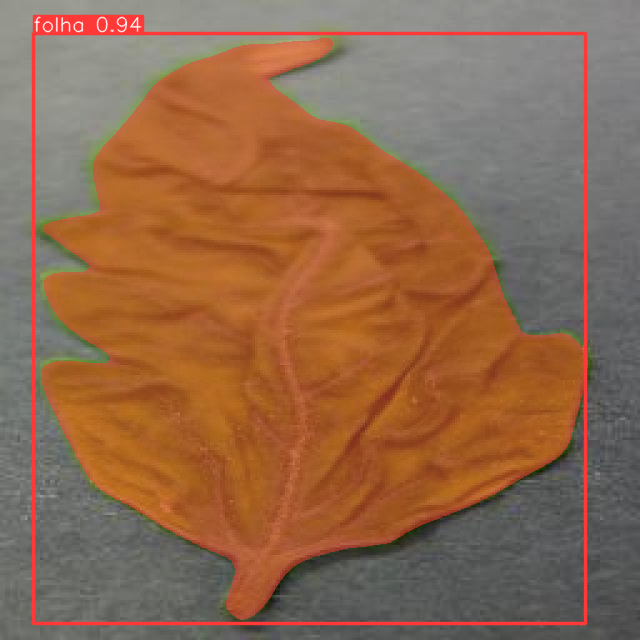

In [ ]:
cv2_imshow(annotated_single)

0d07c65d-0a4f-4a0b-8e5a-ade16407928a___UF-GRC_YLCV_Lab-02450_JPG.rf.e1a9c18bd9f958a8a224025311dc594c.jpg

image 1/1 /content/dataset_folha/test/images/0d07c65d-0a4f-4a0b-8e5a-ade16407928a___UF-GRC_YLCV_Lab-02450_JPG.rf.e1a9c18bd9f958a8a224025311dc594c.jpg: 640x640 1 folha, 11.8ms
Speed: 1.8ms preprocess, 11.8ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


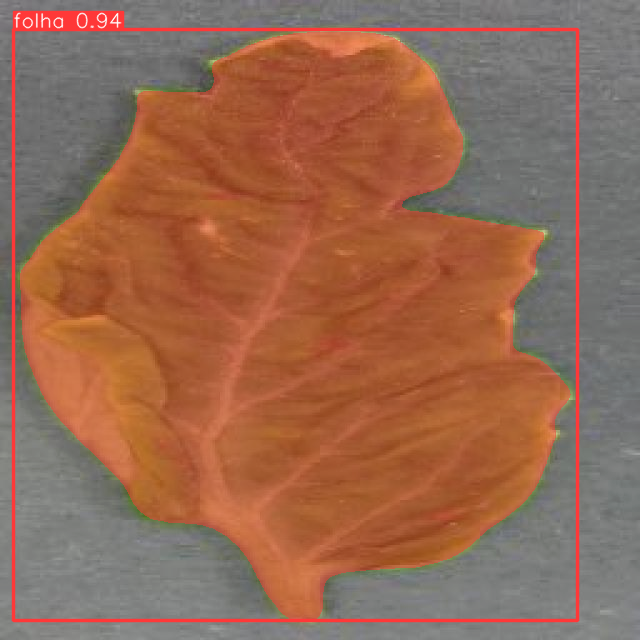

0e4e83c1-3664-4754-956e-5250f49980c2___UF-GRC_YLCV_Lab-02976_JPG.rf.dc81704fafa6b711baa8bac23912de06.jpg

image 1/1 /content/dataset_folha/test/images/0e4e83c1-3664-4754-956e-5250f49980c2___UF-GRC_YLCV_Lab-02976_JPG.rf.dc81704fafa6b711baa8bac23912de06.jpg: 640x640 1 folha, 13.4ms
Speed: 2.0ms preprocess, 13.4ms inference, 6.5ms postprocess per image at shape (1, 3, 640, 640)


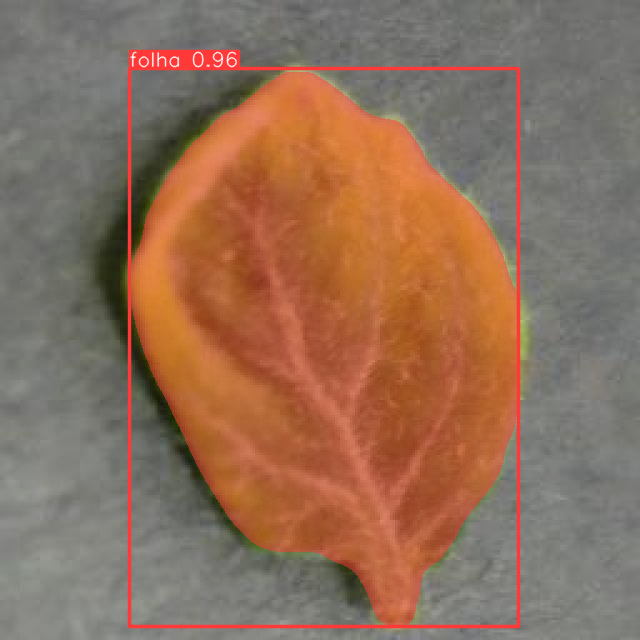

1e5d50b9-7cf6-4ea3-9e39-020e59c72130___UF-GRC_YLCV_Lab-03092_JPG.rf.06c854c3e4d926a2148834aae37549f7.jpg

image 1/1 /content/dataset_folha/test/images/1e5d50b9-7cf6-4ea3-9e39-020e59c72130___UF-GRC_YLCV_Lab-03092_JPG.rf.06c854c3e4d926a2148834aae37549f7.jpg: 640x640 1 folha, 27.7ms
Speed: 1.9ms preprocess, 27.7ms inference, 14.2ms postprocess per image at shape (1, 3, 640, 640)


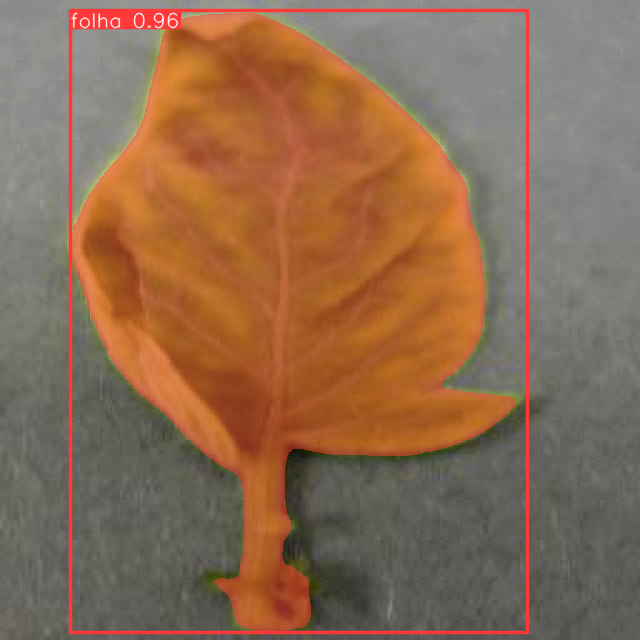

1df0792a-e9eb-4eef-8e59-77ac4ed0a422___UF-GRC_YLCV_Lab-02641_JPG.rf.bcc803da379bebbd6423c8518086b51f.jpg

image 1/1 /content/dataset_folha/test/images/1df0792a-e9eb-4eef-8e59-77ac4ed0a422___UF-GRC_YLCV_Lab-02641_JPG.rf.bcc803da379bebbd6423c8518086b51f.jpg: 640x640 1 folha, 19.3ms
Speed: 2.1ms preprocess, 19.3ms inference, 7.2ms postprocess per image at shape (1, 3, 640, 640)


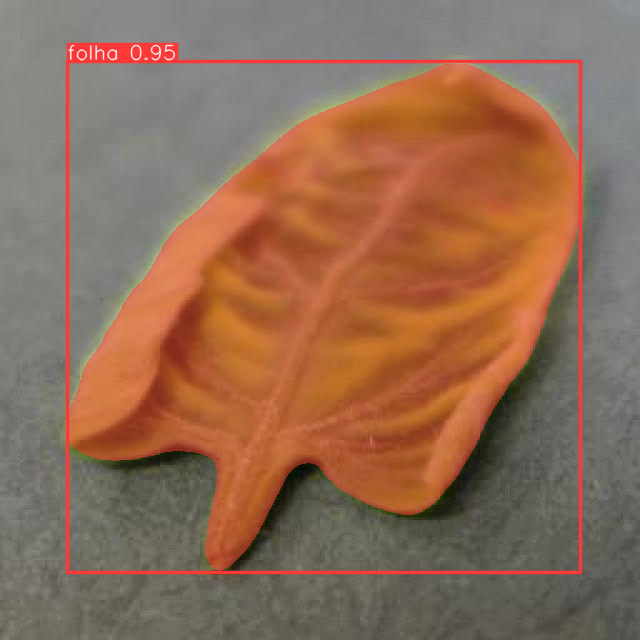

0fe8e176-9806-44bb-9dbd-394e47305776___UF-GRC_YLCV_Lab-02654_JPG.rf.7742e792b473da444e25b7bb7e9d88d1.jpg

image 1/1 /content/dataset_folha/test/images/0fe8e176-9806-44bb-9dbd-394e47305776___UF-GRC_YLCV_Lab-02654_JPG.rf.7742e792b473da444e25b7bb7e9d88d1.jpg: 640x640 1 folha, 49.8ms
Speed: 12.1ms preprocess, 49.8ms inference, 11.0ms postprocess per image at shape (1, 3, 640, 640)


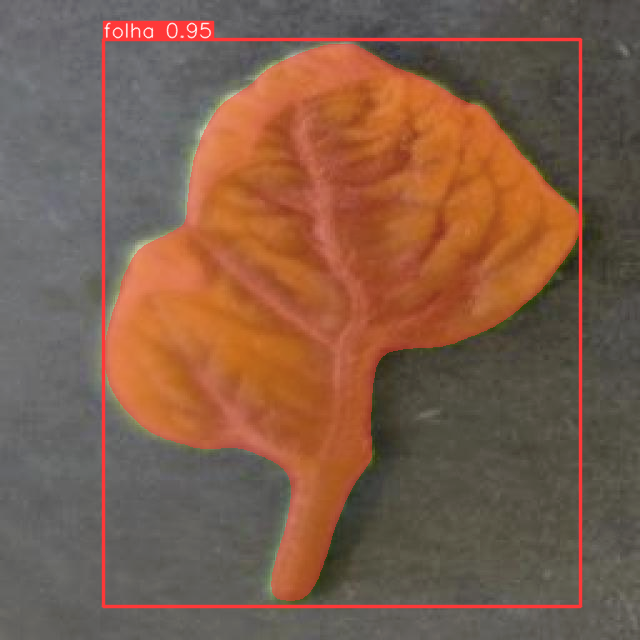

0c9ad7ef-1db7-4a0b-864d-7b6ca98a0282___UF-GRC_YLCV_Lab-01506_JPG.rf.489a5e1f82e5fbaa34c7400e1fd26695.jpg

image 1/1 /content/dataset_folha/test/images/0c9ad7ef-1db7-4a0b-864d-7b6ca98a0282___UF-GRC_YLCV_Lab-01506_JPG.rf.489a5e1f82e5fbaa34c7400e1fd26695.jpg: 640x640 1 folha, 30.7ms
Speed: 5.3ms preprocess, 30.7ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)


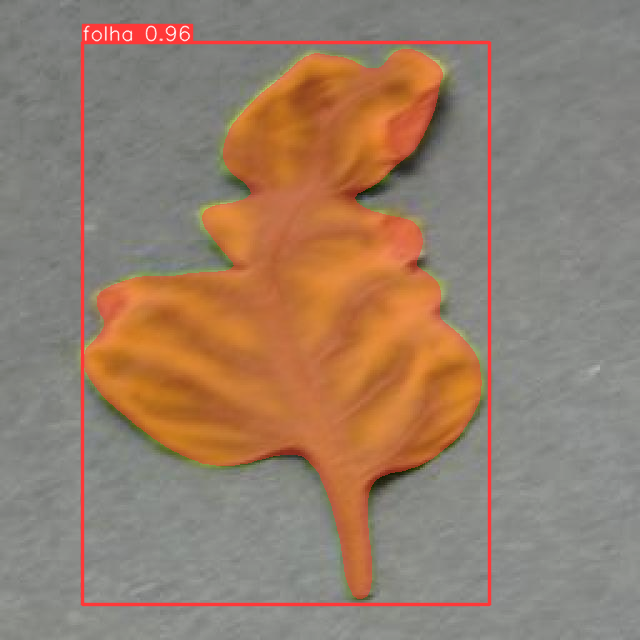

1c0478dc-09a0-4828-ab05-60c7063c7491___UF-GRC_YLCV_Lab-03153_JPG.rf.282100ce2c1ebaf00b7814917e685803.jpg

image 1/1 /content/dataset_folha/test/images/1c0478dc-09a0-4828-ab05-60c7063c7491___UF-GRC_YLCV_Lab-03153_JPG.rf.282100ce2c1ebaf00b7814917e685803.jpg: 640x640 1 folha, 130.7ms
Speed: 13.0ms preprocess, 130.7ms inference, 26.8ms postprocess per image at shape (1, 3, 640, 640)


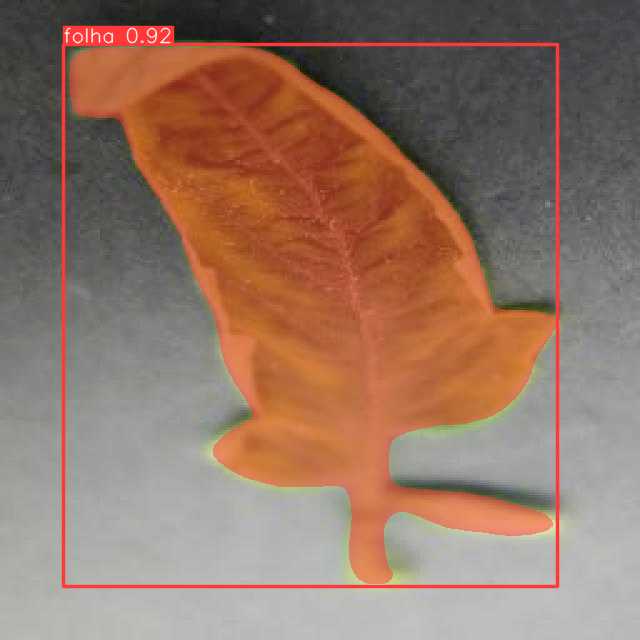

0eac2833-5c90-4777-8e7d-b5c41785644b___UF-GRC_YLCV_Lab-09400_JPG.rf.21e9ef13af0a887df7332b2724263d70.jpg

image 1/1 /content/dataset_folha/test/images/0eac2833-5c90-4777-8e7d-b5c41785644b___UF-GRC_YLCV_Lab-09400_JPG.rf.21e9ef13af0a887df7332b2724263d70.jpg: 640x640 1 folha, 91.8ms
Speed: 2.5ms preprocess, 91.8ms inference, 23.4ms postprocess per image at shape (1, 3, 640, 640)


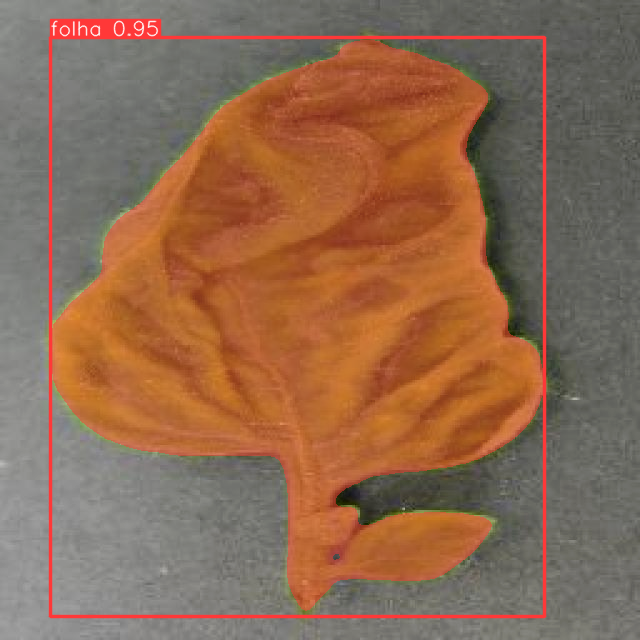

0bbc17fe-64da-46f7-938b-7208cc81c19a___UF-GRC_YLCV_Lab-02304_JPG.rf.0d7b4663854a8dac9c8ef6deb8240ddb.jpg

image 1/1 /content/dataset_folha/test/images/0bbc17fe-64da-46f7-938b-7208cc81c19a___UF-GRC_YLCV_Lab-02304_JPG.rf.0d7b4663854a8dac9c8ef6deb8240ddb.jpg: 640x640 1 folha, 14.7ms
Speed: 2.1ms preprocess, 14.7ms inference, 5.2ms postprocess per image at shape (1, 3, 640, 640)


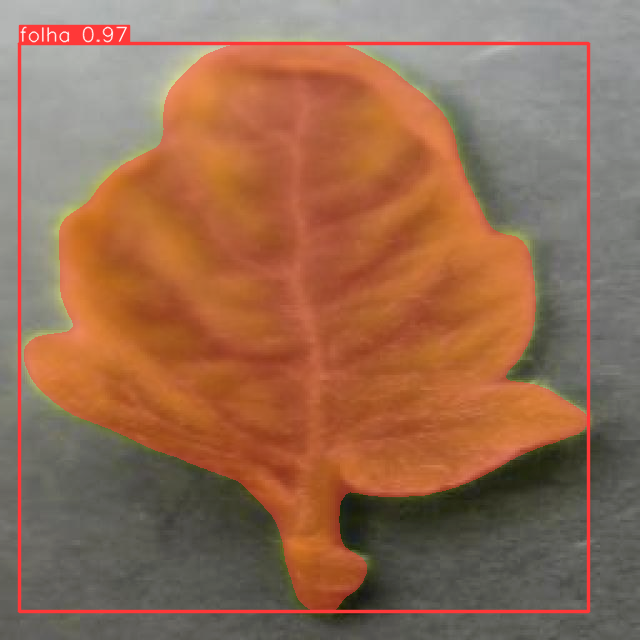

1b984071-0529-4e15-9157-0b4b4a214d8f___UF-GRC_YLCV_Lab-08574_JPG.rf.542be6cba3f66df29adc3b92f6790925.jpg

image 1/1 /content/dataset_folha/test/images/1b984071-0529-4e15-9157-0b4b4a214d8f___UF-GRC_YLCV_Lab-08574_JPG.rf.542be6cba3f66df29adc3b92f6790925.jpg: 640x640 1 folha, 18.5ms
Speed: 5.0ms preprocess, 18.5ms inference, 6.4ms postprocess per image at shape (1, 3, 640, 640)


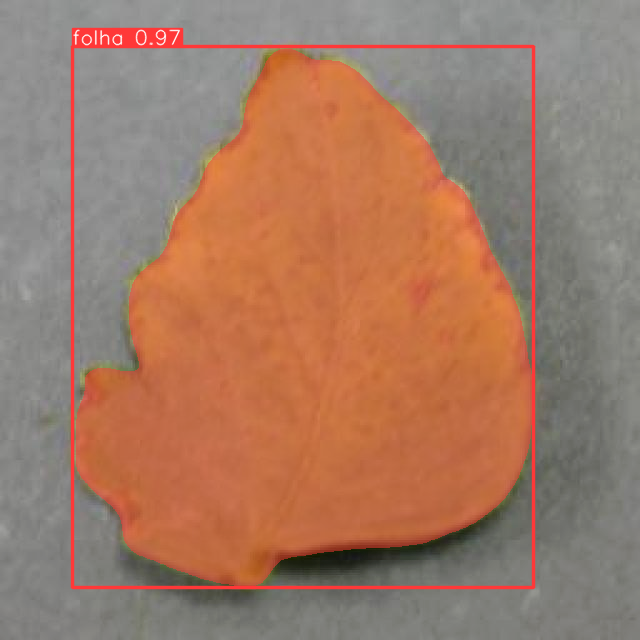

1fab93a9-7b17-483d-9b6e-02a166cbfc36___UF-GRC_YLCV_Lab-08442_JPG.rf.b5a6d90e9acc497edc64041d28dbbb37.jpg

image 1/1 /content/dataset_folha/test/images/1fab93a9-7b17-483d-9b6e-02a166cbfc36___UF-GRC_YLCV_Lab-08442_JPG.rf.b5a6d90e9acc497edc64041d28dbbb37.jpg: 640x640 1 folha, 14.8ms
Speed: 2.1ms preprocess, 14.8ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)


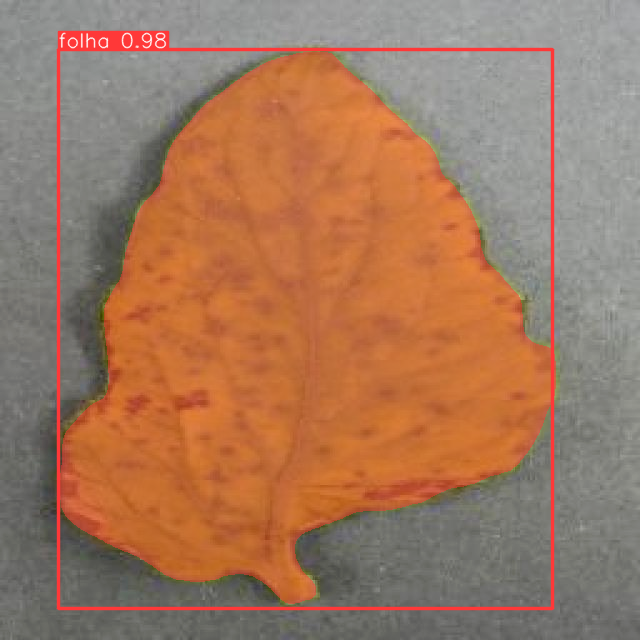

0b3778d6-b81e-43eb-9512-7e9067a9ca8f___UF-GRC_YLCV_Lab-08551_JPG.rf.ba31b07ff2eaafd37fe07b53e711db79.jpg

image 1/1 /content/dataset_folha/test/images/0b3778d6-b81e-43eb-9512-7e9067a9ca8f___UF-GRC_YLCV_Lab-08551_JPG.rf.ba31b07ff2eaafd37fe07b53e711db79.jpg: 640x640 1 folha, 17.9ms
Speed: 1.9ms preprocess, 17.9ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


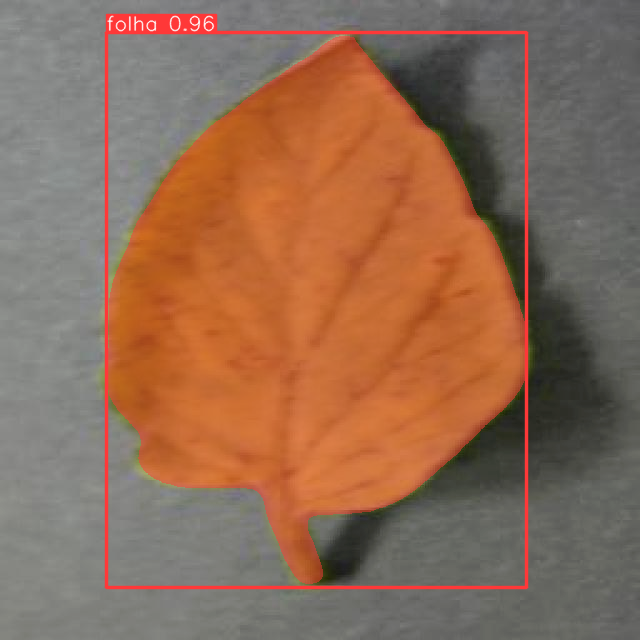

1d3807d1-263e-4818-ac13-416627479eb9___UF-GRC_YLCV_Lab-02241_JPG.rf.4529a8f186531ad7337e68cd31d3ac69.jpg

image 1/1 /content/dataset_folha/test/images/1d3807d1-263e-4818-ac13-416627479eb9___UF-GRC_YLCV_Lab-02241_JPG.rf.4529a8f186531ad7337e68cd31d3ac69.jpg: 640x640 1 folha, 15.6ms
Speed: 1.9ms preprocess, 15.6ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)


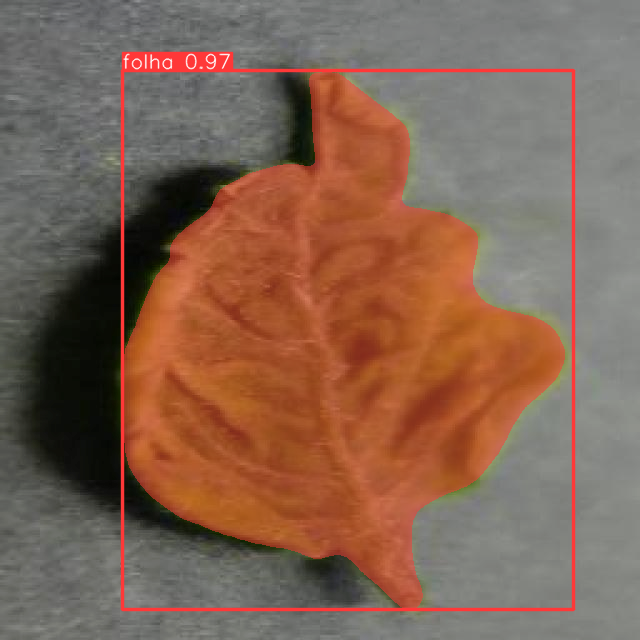

2d3a1131-5dde-4d05-ab1a-2a051ea680ef___UF-GRC_YLCV_Lab-08542_JPG.rf.69641112fb05c2f1da0611b3253411ca.jpg

image 1/1 /content/dataset_folha/test/images/2d3a1131-5dde-4d05-ab1a-2a051ea680ef___UF-GRC_YLCV_Lab-08542_JPG.rf.69641112fb05c2f1da0611b3253411ca.jpg: 640x640 1 folha, 19.4ms
Speed: 2.0ms preprocess, 19.4ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


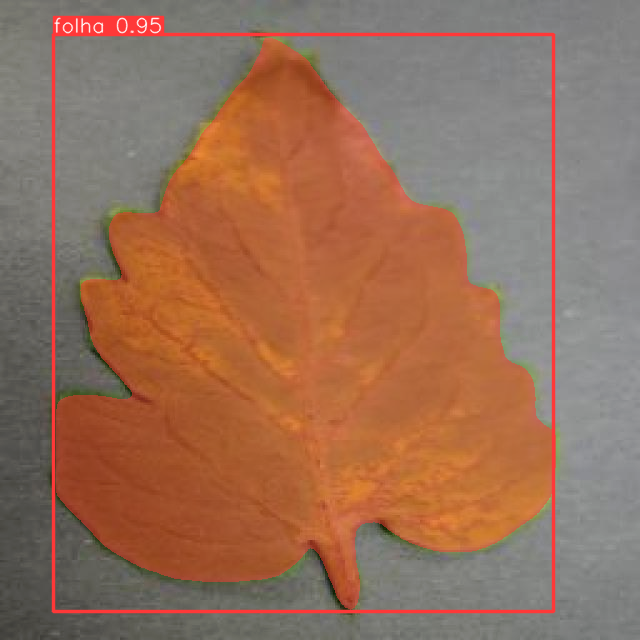

1d8627f3-55b7-46c6-8cae-af9737f11f79___UF-GRC_YLCV_Lab-02472_JPG.rf.9d234fb6317507b529c670d634d16b89.jpg

image 1/1 /content/dataset_folha/test/images/1d8627f3-55b7-46c6-8cae-af9737f11f79___UF-GRC_YLCV_Lab-02472_JPG.rf.9d234fb6317507b529c670d634d16b89.jpg: 640x640 1 folha, 18.1ms
Speed: 1.9ms preprocess, 18.1ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)


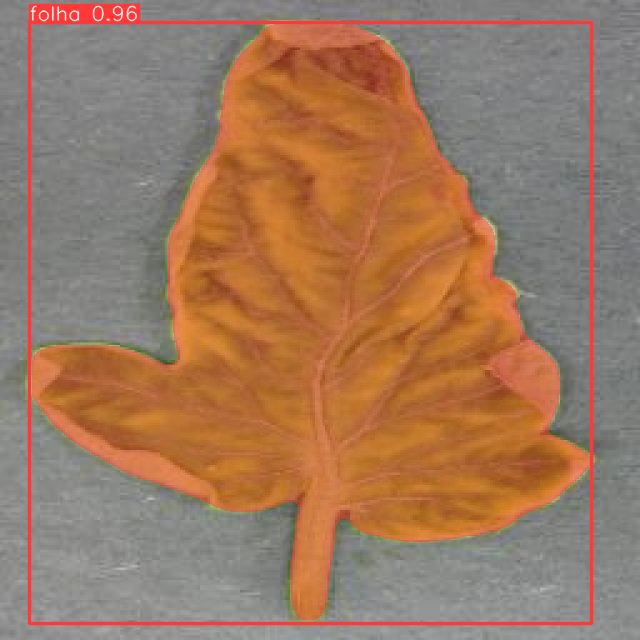

0a5431ac-44ff-4507-a8aa-6eee46235015___UF-GRC_YLCV_Lab-03031_JPG.rf.094fb949507b1c90e23187013a2e1ed5.jpg

image 1/1 /content/dataset_folha/test/images/0a5431ac-44ff-4507-a8aa-6eee46235015___UF-GRC_YLCV_Lab-03031_JPG.rf.094fb949507b1c90e23187013a2e1ed5.jpg: 640x640 1 folha, 20.4ms
Speed: 1.9ms preprocess, 20.4ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


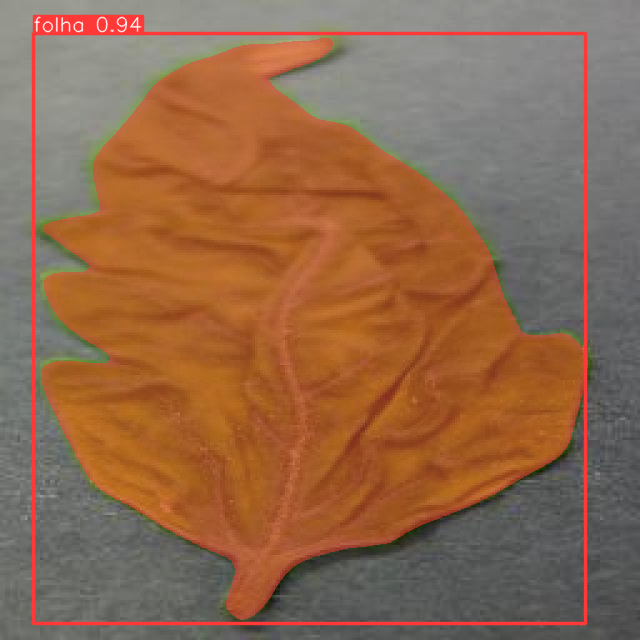

1fd65528-6e15-4280-b940-9df51be1aced___UF-GRC_YLCV_Lab-08548_JPG.rf.0ed5adb1d44b471f8b2748c954c829a7.jpg

image 1/1 /content/dataset_folha/test/images/1fd65528-6e15-4280-b940-9df51be1aced___UF-GRC_YLCV_Lab-08548_JPG.rf.0ed5adb1d44b471f8b2748c954c829a7.jpg: 640x640 1 folha, 15.5ms
Speed: 4.2ms preprocess, 15.5ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)


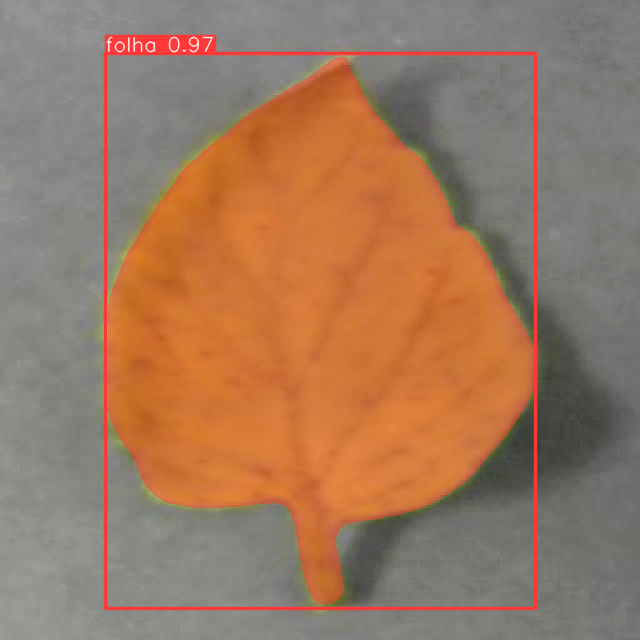

2cf77de4-b5cd-404b-8949-53c5687d3936___UF-GRC_YLCV_Lab-09541_JPG.rf.8c7df21083a99ff3b7ecc10f0b8a7c0c.jpg

image 1/1 /content/dataset_folha/test/images/2cf77de4-b5cd-404b-8949-53c5687d3936___UF-GRC_YLCV_Lab-09541_JPG.rf.8c7df21083a99ff3b7ecc10f0b8a7c0c.jpg: 640x640 1 folha, 17.7ms
Speed: 5.9ms preprocess, 17.7ms inference, 8.5ms postprocess per image at shape (1, 3, 640, 640)


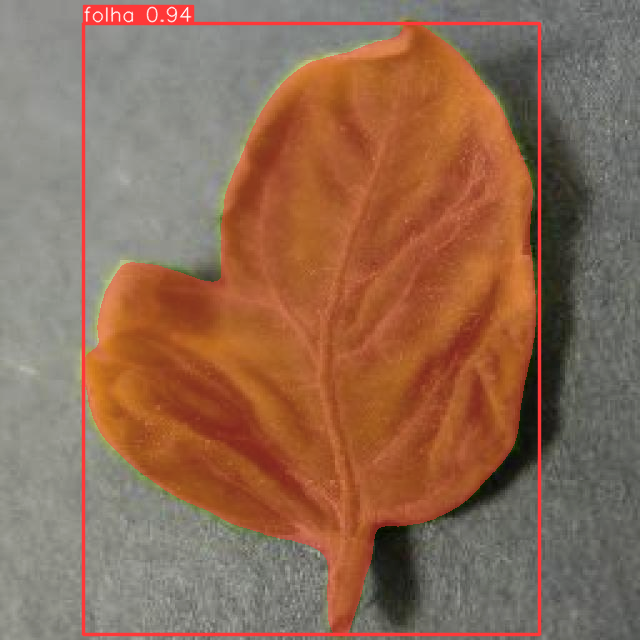

0ae630bc-8f67-40b7-b264-120ba0d66341___YLCV_GCREC-5115_JPG.rf.40c8010c1959fc7e8ab0c09fbfb26908.jpg

image 1/1 /content/dataset_folha/test/images/0ae630bc-8f67-40b7-b264-120ba0d66341___YLCV_GCREC-5115_JPG.rf.40c8010c1959fc7e8ab0c09fbfb26908.jpg: 640x640 1 folha, 17.5ms
Speed: 3.5ms preprocess, 17.5ms inference, 9.4ms postprocess per image at shape (1, 3, 640, 640)


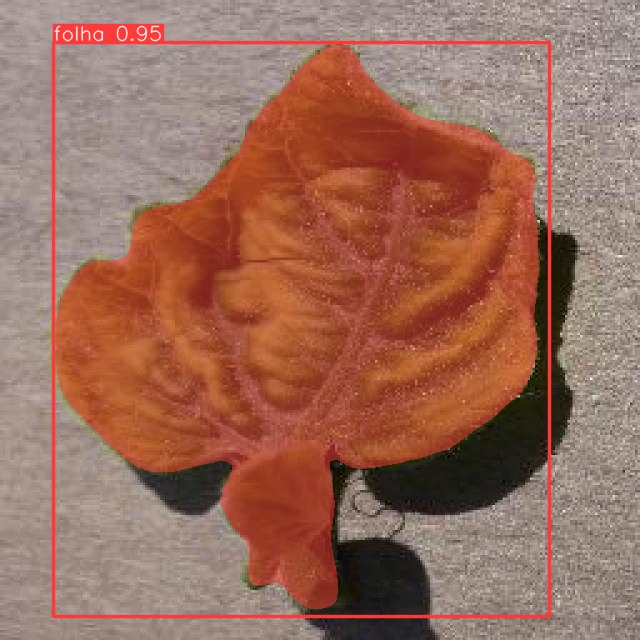

2d3baec6-4431-4b09-8645-73d4c97547b3___UF-GRC_YLCV_Lab-02084_JPG.rf.a185b2efd5cb5e67a9b743af0b08053d.jpg

image 1/1 /content/dataset_folha/test/images/2d3baec6-4431-4b09-8645-73d4c97547b3___UF-GRC_YLCV_Lab-02084_JPG.rf.a185b2efd5cb5e67a9b743af0b08053d.jpg: 640x640 1 folha, 15.2ms
Speed: 1.8ms preprocess, 15.2ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)


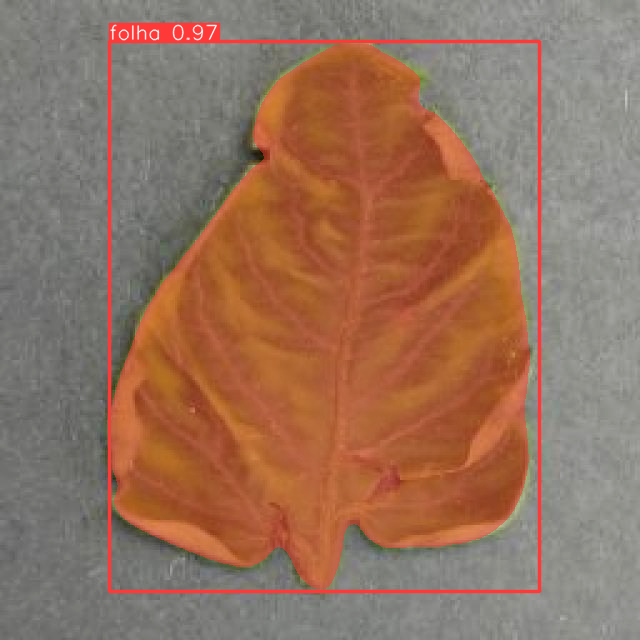

0ef5dfde-771e-45cc-b0b1-38f1bc72547c___UF-GRC_YLCV_Lab-03247_JPG.rf.155fc2db0fcc20611be29ba0ece19e44.jpg

image 1/1 /content/dataset_folha/test/images/0ef5dfde-771e-45cc-b0b1-38f1bc72547c___UF-GRC_YLCV_Lab-03247_JPG.rf.155fc2db0fcc20611be29ba0ece19e44.jpg: 640x640 1 folha, 15.7ms
Speed: 3.2ms preprocess, 15.7ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)


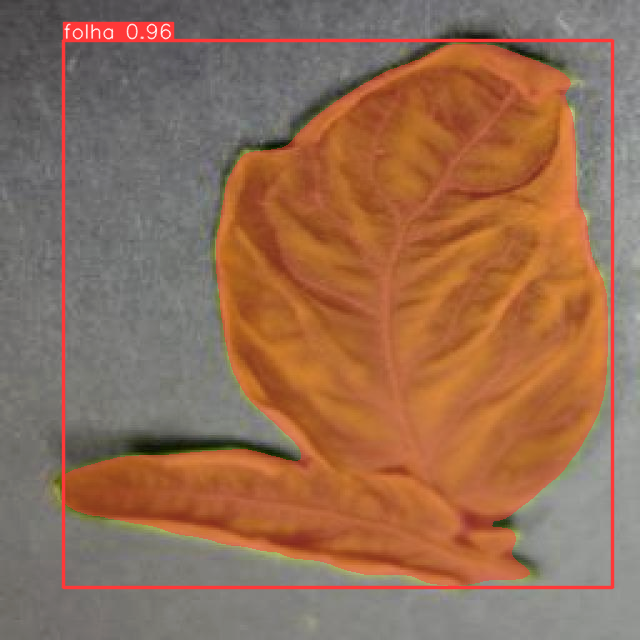

2ba77bb3-aec1-4fff-bc95-99e28c7b85f7___UF-GRC_YLCV_Lab-08483_JPG.rf.ff50621bc9b3933be6dc5ef9b9a49f28.jpg

image 1/1 /content/dataset_folha/test/images/2ba77bb3-aec1-4fff-bc95-99e28c7b85f7___UF-GRC_YLCV_Lab-08483_JPG.rf.ff50621bc9b3933be6dc5ef9b9a49f28.jpg: 640x640 1 folha, 16.0ms
Speed: 1.9ms preprocess, 16.0ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)


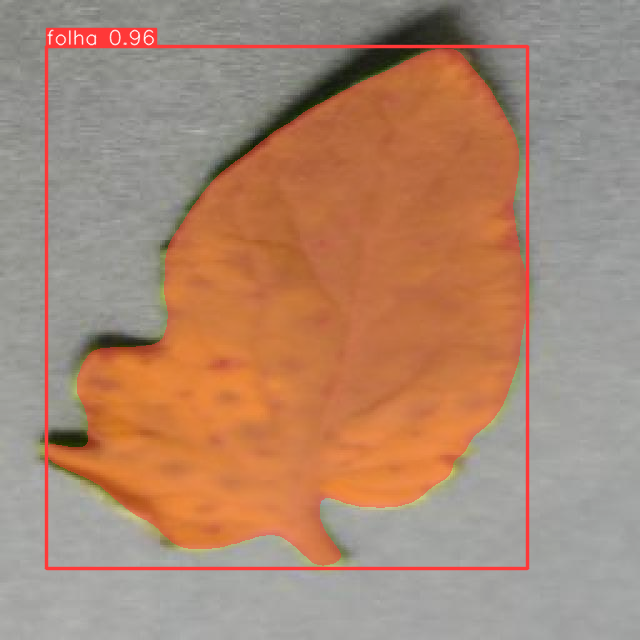

1b85c0b1-e76a-4bfb-9bb2-576103e7a5bb___UF-GRC_YLCV_Lab-01824_JPG.rf.0fdd41636114e461e56590b9f0817f3f.jpg

image 1/1 /content/dataset_folha/test/images/1b85c0b1-e76a-4bfb-9bb2-576103e7a5bb___UF-GRC_YLCV_Lab-01824_JPG.rf.0fdd41636114e461e56590b9f0817f3f.jpg: 640x640 1 folha, 14.8ms
Speed: 1.9ms preprocess, 14.8ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)


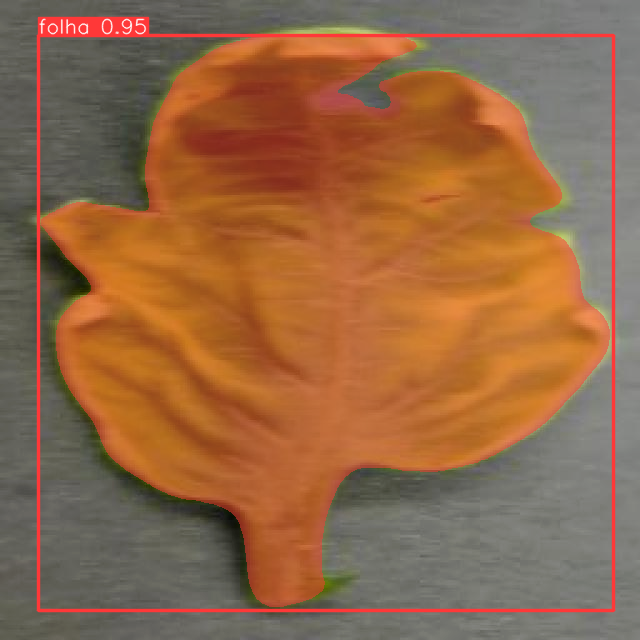

In [ ]:
# Predict with the model
img_test_path = '/content/dataset_folha/test/images/'
for image in os.listdir(img_test_path):
  print(image)
  results_test = model_(img_test_path + image)  # predict on an image
  annotated_image = results_test[0].plot()
  cv2_imshow(annotated_image)

In [ ]:
shutil.copytree('/content/seg_folha_fundo', '/content/gdrive/MyDrive/Colab Notebooks/INE410121 - VC 2023 - files/seg_folha_fundo')

'/content/gdrive/MyDrive/Colab Notebooks/INE410121 - VC 2023 - files/seg_folha_fundo'